In [71]:
import plotly.graph_objects as go
import plotly.offline as offline_py
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import plotly.figure_factory as ff
import numpy as np
import plotly.express as px
import seaborn as sns
%matplotlib inline

In [92]:
import pandas as pd
df = pd.read_csv("../../data/random_samples/stratified_sampling_clean_text_data_by_price_whigh_sz50000_1619835594.csv")
# size of dataset
print('The size of the dataset is: {} \n'.format(df.shape))

df.head(3)

The size of the dataset is: (50000, 34) 



,train_id,clean_item_description,item_description_bef_word_count,item_description_bef_char_count,item_description_bef_avg_word_len,item_description_upper_word_count,item_description_upper_char_count,item_description_stopword_count,item_description_punctuation_count,item_description_number_count,...,item_name_after_avg_word_len,item_condition_id,category_name,brand_name,shipping,price,c1,c2,c3,price_bin
0,806824,new tags,3.0,13.0,4.333333,0.0,1.0,1.0,0.0,0.0,...,5.250000,1,Women/Athletic Apparel/Shirts & Tops,Nike,1,15.0,women,athletic apparel,shirts & tops,"(10, 15]"
1,772820,nastasya every hills lipstick fashion,6.0,42.0,7.000000,0.0,4.0,1.0,0.0,0.0,...,10.000000,1,Beauty/Makeup/Lips,Anastasia Beverly Hills,0,22.0,beauty,makeup,lips,"(20, 25]"
2,1423115,brand new tags taken bag pictures,11.0,54.0,4.909091,0.0,1.0,5.0,0.0,0.0,...,6.166667,1,Women/Jeans/Leggings,LuLaRoe,0,54.0,women,jeans,leggings,"(50, 60]"


In [93]:
df.price.describe()

count    50000.00000
mean       108.41749
std        198.75487
min          3.00000
25%         20.00000
50%         50.00000
75%         90.00000
max       2009.00000
Name: price, dtype: float64

In [20]:
df['c1'].value_counts()

women                     26755
electronics                5669
men                        4790
beauty                     4502
kids                       4069
vintage & collectibles     1828
home                       1430
sports & outdoors           624
other                       328
handmade                      5
Name: c1, dtype: int64

In [15]:
# most popular categories -- Women, electronics and men
x = df['c1'].value_counts().index.values.astype('str')[:15]
y = df['c1'].value_counts().values[:15]
pct = [("%.2f"%(v*100))+"%" for v in (y/len(df))] [:15]

In [16]:
trace1 = go.Bar(x=x, y=y, text=pct)
layout = dict(title= 'Number of Items by Main Category',
              yaxis = dict(title='Count'),
              xaxis = dict(title='Brand'))
fig=dict(data=[trace1], layout=layout)
offline_py.iplot(fig)

In [28]:
x = df['brand_name'].value_counts().index.values.astype('str')[:15]
y = df['brand_name'].value_counts().values[:15]
pct = [("%.2f"%(v*100))+"%" for v in (y/len(df))] [:15]

In [30]:
x

array(['Nike', 'PINK', 'Apple', "Victoria's Secret", 'LuLaRoe',
       'Louis Vuitton', 'Michael Kors', 'Lululemon', 'Nintendo',
       'Rae Dunn', 'Coach', 'Adidas', 'Kendra Scott', 'Kate Spade',
       'Air Jordan'], dtype='<U32')

In [18]:
colorscale = [[0, '#FAEE1C'], [0.33, '#F3558E'], [0.66, '#9C1DE7'], [1, '#581B98']]

In [19]:
# most popular brands -- Nike & PINK
trace1 = go.Bar(x=x, y=y, text=pct, marker=dict(color = y, colorscale=colorscale, showscale=True))
layout = dict(title= 'Number of Items by brand name',
              yaxis = dict(title='Count'),
              xaxis = dict(title='Brand'))
fig=dict(data=[trace1], layout=layout)
offline_py.iplot(fig)

In [41]:
fig = px.box(df, x="c1", y="price", labels= {'c1': 'Main Item Category'}, title="Price Distribution among Item Category")
fig.show()

In [94]:
df['log_price'] = np.log(df['price'] + 1)
fig = px.box(df, x="c1", y="log_price", labels= {'c1': 'Main Item Category'}, title="Log Price Distribution among Item Category")
fig.show()

# sns.boxplot(x = df.log_price, y = category, orient='h', order=order)
# plt.title("Log Price Base On Main Subcategories", fontsize = 20)
# plt.ylabel("Categories", fontsize = 15)
# plt.show()

In [95]:
select_brands = df['brand_name'].value_counts().index.values.astype('str')[:20]
fig = px.box(df[df.brand_name.isin(select_brands)], x="brand_name", y="price",title="Price Distribution among Item Brand")
fig.show()

In [96]:
select_brands = df['brand_name'].value_counts().index.values.astype('str')[:20]
fig = px.box(df[df.brand_name.isin(select_brands)], x="brand_name", y="log_price",title=" Log Price Distribution among Item Brand")
fig.show()

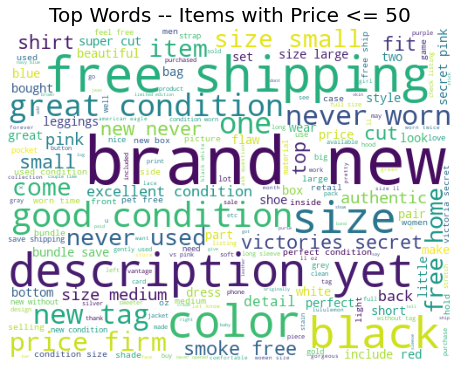

In [65]:
# Word for Item with price <= 50
description = df.loc[df.price <= 50,'clean_item_description' ]

plt.subplots(figsize = (8,8))

wordcloud = WordCloud (
                    background_color = 'white',
                    width = 512,
                    height = 384
                        ).generate(' '.join(description))
plt.imshow(wordcloud) # image show
plt.axis('off') # to off the axis of x and y
plt.title('Top Words -- Items with Price <= 50',fontdict = {'fontsize' : 20})
plt.show()

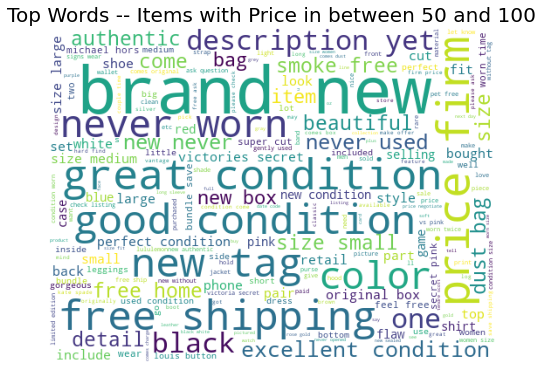

In [68]:
# Word for Item with price less than 20
description = df.loc[(df.price > 50)|(df.price <= 100),'clean_item_description' ]

plt.subplots(figsize = (8,8))

wordcloud = WordCloud (
                    background_color = 'white',
                    width = 512,
                    height = 384
                        ).generate(' '.join(description))
plt.imshow(wordcloud) # image show
plt.axis('off') # to off the axis of x and y
plt.title('Top Words -- Items with Price in between 50 and 100',fontdict = {'fontsize' : 20})
plt.show()

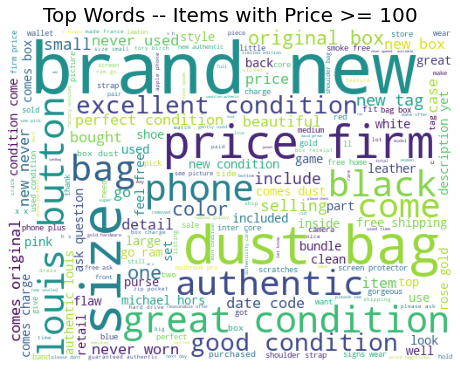

In [69]:
# Word for Item with price <= 50
description = df.loc[df.price >=100,'clean_item_description' ]

plt.subplots(figsize = (8,8))

wordcloud = WordCloud (
                    background_color = 'white',
                    width = 512,
                    height = 384
                        ).generate(' '.join(description))
plt.imshow(wordcloud) # image show
plt.axis('off') # to off the axis of x and y
plt.title('Top Words -- Items with Price >= 100',fontdict = {'fontsize' : 20})
plt.show()

In [75]:
columns = list(df.columns)
correlation  = df[columns].corr()
correlation

,train_id,item_description_bef_word_count,item_description_bef_char_count,item_description_bef_avg_word_len,item_description_upper_word_count,item_description_upper_char_count,item_description_stopword_count,item_description_punctuation_count,item_description_number_count,item_description_after_word_count,...,item_name_upper_char_count,item_name_stopword_count,item_name_punctuation_count,item_name_number_count,item_name_after_word_count,item_name_after_char_count,item_name_after_avg_word_len,item_condition_id,shipping,price
train_id,1.000000,0.002178,0.001987,-0.003383,-0.001617,-0.000968,0.002220,-0.004960,0.002571,0.002060,...,-0.004083,-0.004221,-0.005692,0.010537,-0.004435,-0.008035,-0.003541,0.005582,-0.003033,-0.009540
item_description_bef_word_count,0.002178,1.000000,0.992286,-0.012556,0.451647,0.530590,0.894753,0.784443,0.376811,0.971138,...,0.201534,0.030463,0.115613,0.055574,0.222805,0.230924,0.020313,0.019332,0.004640,0.195118
item_description_bef_char_count,0.001987,0.992286,1.000000,0.059750,0.446337,0.538537,0.858614,0.805629,0.361978,0.981050,...,0.208823,0.028135,0.116354,0.048245,0.224397,0.240041,0.032900,0.009908,0.010499,0.196461
item_description_bef_avg_word_len,-0.003383,-0.012556,0.059750,1.000000,-0.005702,0.052959,-0.124017,0.110235,-0.099073,0.055475,...,0.048284,-0.016927,0.028050,-0.052842,0.009781,0.079352,0.125492,0.005596,0.038857,0.030132
item_description_upper_word_count,-0.001617,0.451647,0.446337,-0.005702,1.000000,0.964949,0.373028,0.398860,0.174094,0.449815,...,0.356160,0.016306,0.077424,0.030458,0.134031,0.114259,-0.023824,-0.074233,0.005970,0.071956
item_description_upper_char_count,-0.000968,0.530590,0.538537,0.052959,0.964949,1.000000,0.393204,0.485046,0.223237,0.553027,...,0.374151,0.023017,0.092440,0.032382,0.163638,0.152302,-0.007572,-0.091592,0.014300,0.088586
item_description_stopword_count,0.002220,0.894753,0.858614,-0.124017,0.373028,0.393204,1.000000,0.611354,0.207114,0.767365,...,0.136888,0.027178,0.085482,0.054633,0.165317,0.170244,0.009856,0.090946,-0.004858,0.157125
item_description_punctuation_count,-0.004960,0.784443,0.805629,0.110235,0.398860,0.485046,0.611354,1.000000,0.268349,0.797193,...,0.182475,0.013036,0.144207,0.026561,0.180651,0.197742,0.036082,-0.025441,0.012855,0.157473
item_description_number_count,0.002571,0.376811,0.361978,-0.099073,0.174094,0.223237,0.207114,0.268349,1.000000,0.434965,...,0.046899,0.026993,0.057339,0.170085,0.084315,0.059017,-0.031431,-0.012765,-0.008370,0.112014
item_description_after_word_count,0.002060,0.971138,0.981050,0.055475,0.449815,0.553027,0.767365,0.797193,0.434965,1.000000,...,0.217030,0.029659,0.119352,0.051621,0.234945,0.244216,0.024377,-0.018610,0.008702,0.200843


In [79]:
correlation_price = correlation['price']

In [80]:
correlation_price

train_id                              -0.009540
item_description_bef_word_count        0.195118
item_description_bef_char_count        0.196461
item_description_bef_avg_word_len      0.030132
item_description_upper_word_count      0.071956
item_description_upper_char_count      0.088586
item_description_stopword_count        0.157125
item_description_punctuation_count     0.157473
item_description_number_count          0.112014
item_description_after_word_count      0.200843
item_description_after_char_count      0.199840
item_description_after_avg_word_len    0.056386
item_name_bef_word_count               0.055551
item_name_bef_char_count               0.066383
item_name_bef_avg_word_len            -0.000588
item_name_upper_word_count             0.024320
item_name_upper_char_count             0.032935
item_name_stopword_count              -0.046140
item_name_punctuation_count            0.017044
item_name_number_count                 0.098398
item_name_after_word_count             0

In [88]:
fig = px.bar(correlation_price[1:-1], title="Correlation coefficient with Price",labels={"value": "correlation coefficient","index": "variable name"})
fig.update_layout(showlegend=False)
fig.show()

In [83]:
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()
le.fit(np.hstack([df.brand_name]))
df["brand_name"] = le.transform(df.brand_name)
le.fit(np.hstack([df.c1]))
df["c1"] = le.transform(df.c1)
le.fit(np.hstack([df.c2]))
df["c2"] = le.transform(df.c2)
le.fit(np.hstack([df.c3]))
df["c3"] = le.transform(df.c3)

In [78]:
columns = list(df.columns)
new_correlation  = df[columns].corr()
new_correlation

,train_id,item_description_bef_word_count,item_description_bef_char_count,item_description_bef_avg_word_len,item_description_upper_word_count,item_description_upper_char_count,item_description_stopword_count,item_description_punctuation_count,item_description_number_count,item_description_after_word_count,...,item_name_after_word_count,item_name_after_char_count,item_name_after_avg_word_len,item_condition_id,brand_name,shipping,price,c1,c2,c3
train_id,1.000000,0.002178,0.001987,-0.003383,-0.001617,-0.000968,0.002220,-0.004960,0.002571,0.002060,...,-0.004435,-0.008035,-0.003541,0.005582,-0.000789,-0.003033,-0.009540,-0.006128,-0.004536,-0.007379
item_description_bef_word_count,0.002178,1.000000,0.992286,-0.012556,0.451647,0.530590,0.894753,0.784443,0.376811,0.971138,...,0.222805,0.230924,0.020313,0.019332,-0.021235,0.004640,0.195118,-0.052289,-0.001023,0.011410
item_description_bef_char_count,0.001987,0.992286,1.000000,0.059750,0.446337,0.538537,0.858614,0.805629,0.361978,0.981050,...,0.224397,0.240041,0.032900,0.009908,-0.018804,0.010499,0.196461,-0.053969,0.001065,0.015078
item_description_bef_avg_word_len,-0.003383,-0.012556,0.059750,1.000000,-0.005702,0.052959,-0.124017,0.110235,-0.099073,0.055475,...,0.009781,0.079352,0.125492,0.005596,-0.001396,0.038857,0.030132,-0.001325,0.022977,0.030469
item_description_upper_word_count,-0.001617,0.451647,0.446337,-0.005702,1.000000,0.964949,0.373028,0.398860,0.174094,0.449815,...,0.134031,0.114259,-0.023824,-0.074233,0.000984,0.005970,0.071956,-0.041672,-0.019335,0.005066
item_description_upper_char_count,-0.000968,0.530590,0.538537,0.052959,0.964949,1.000000,0.393204,0.485046,0.223237,0.553027,...,0.163638,0.152302,-0.007572,-0.091592,-0.000450,0.014300,0.088586,-0.054203,-0.017024,0.005201
item_description_stopword_count,0.002220,0.894753,0.858614,-0.124017,0.373028,0.393204,1.000000,0.611354,0.207114,0.767365,...,0.165317,0.170244,0.009856,0.090946,-0.024904,-0.004858,0.157125,-0.043767,0.002042,-0.013895
item_description_punctuation_count,-0.004960,0.784443,0.805629,0.110235,0.398860,0.485046,0.611354,1.000000,0.268349,0.797193,...,0.180651,0.197742,0.036082,-0.025441,-0.021172,0.012855,0.157473,-0.025924,0.000070,0.020835
item_description_number_count,0.002571,0.376811,0.361978,-0.099073,0.174094,0.223237,0.207114,0.268349,1.000000,0.434965,...,0.084315,0.059017,-0.031431,-0.012765,-0.046512,-0.008370,0.112014,-0.119719,-0.035129,-0.040337
item_description_after_word_count,0.002060,0.971138,0.981050,0.055475,0.449815,0.553027,0.767365,0.797193,0.434965,1.000000,...,0.234945,0.244216,0.024377,-0.018610,-0.016994,0.008702,0.200843,-0.051125,-0.001865,0.023870
